# Context of Data
E-commerce Transaction data

Transactions Period - **<span class="mark">Feb 2018 -  Feb 2019</span>** (One year)


In [61]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

import warnings
# current version of seaborn generates a bunch of warnings that we'll ignore
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')

import missingno as msno # missing data visualization module for Python
import pandas_profiling

import gc
import datetime

%matplotlib inline
color = sns.color_palette()

In [62]:
pd.set_option('display.max_rows', 10000)
pd.set_option('display.max_columns', 100)

In [63]:
# specify encoding to deal with different formats
df = pd.read_csv(r'H:\E-Commerce-Data-EDA-master\transaction_data.csv')

In [64]:
df.head()

,UserId,TransactionId,TransactionTime,ItemCode,ItemDescription,NumberOfItemsPurchased,CostPerItem,Country
0,278166,6355745,Sat Feb 02 12:50:00 IST 2019,465549,FAMILY ALBUM WHITE PICTURE FRAME,6,11.73,United Kingdom
1,337701,6283376,Wed Dec 26 09:06:00 IST 2018,482370,LONDON BUS COFFEE MUG,3,3.52,United Kingdom
2,267099,6385599,Fri Feb 15 09:45:00 IST 2019,490728,SET 12 COLOUR PENCILS DOLLY GIRL,72,0.90,France
3,380478,6044973,Fri Jun 22 07:14:00 IST 2018,459186,UNION JACK FLAG LUGGAGE TAG,3,1.73,United Kingdom
4,-1,6143225,Mon Sep 10 11:58:00 IST 2018,1733592,WASHROOM METAL SIGN,3,3.40,United Kingdom


In [65]:
# change the column names
df.rename(index=str, columns={'ItemCode' : 'stock_code',
                              'ItemDescription' : 'description',
                              'NumberOfItemsPurchased' : 'quantity',
                              'TransactionTime' : 'invoice_date',
                              'CostPerItem' : 'unit_price',
                              'UserId' : 'cust_id',
                              'TransactionId':'invoice_num',
                              'Country' : 'country'}, inplace=True)

In [66]:
df.head()

,cust_id,invoice_num,invoice_date,stock_code,description,quantity,unit_price,country
0,278166,6355745,Sat Feb 02 12:50:00 IST 2019,465549,FAMILY ALBUM WHITE PICTURE FRAME,6,11.73,United Kingdom
1,337701,6283376,Wed Dec 26 09:06:00 IST 2018,482370,LONDON BUS COFFEE MUG,3,3.52,United Kingdom
2,267099,6385599,Fri Feb 15 09:45:00 IST 2019,490728,SET 12 COLOUR PENCILS DOLLY GIRL,72,0.90,France
3,380478,6044973,Fri Jun 22 07:14:00 IST 2018,459186,UNION JACK FLAG LUGGAGE TAG,3,1.73,United Kingdom
4,-1,6143225,Mon Sep 10 11:58:00 IST 2018,1733592,WASHROOM METAL SIGN,3,3.40,United Kingdom


# <span class="mark">Data Cleaning</span> 

In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1083818 entries, 0 to 1083817
Data columns (total 8 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   cust_id       1083818 non-null  int64  
 1   invoice_num   1083818 non-null  int64  
 2   invoice_date  1083818 non-null  object 
 3   stock_code    1083818 non-null  int64  
 4   description   1080910 non-null  object 
 5   quantity      1083818 non-null  int64  
 6   unit_price    1083818 non-null  float64
 7   country       1083818 non-null  object 
dtypes: float64(1), int64(4), object(3)
memory usage: 74.4+ MB


## Check missing values for each column 

In [68]:
# check missing values for each column 
df.isnull().sum().sort_values(ascending=False)

description     2908
country            0
unit_price         0
quantity           0
stock_code         0
invoice_date       0
invoice_num        0
cust_id            0
dtype: int64

In [69]:
# check out the rows with missing values
df[df.isnull().any(axis=1)].head()

,cust_id,invoice_num,invoice_date,stock_code,description,quantity,unit_price,country
322,-1,6314803,Mon Jan 14 11:15:00 IST 2019,495159,NaN,9,0.0,United Kingdom
762,-1,6206420,Mon Nov 05 05:34:00 IST 2018,434364,NaN,3,0.0,United Kingdom
1080,-1,6297863,Sat Jan 05 12:06:00 IST 2019,1782417,NaN,-3,0.0,United Kingdom
2204,-1,6142961,Mon Sep 10 09:41:00 IST 2018,458157,NaN,-240,0.0,United Kingdom
2210,-1,6176445,Mon Oct 08 10:06:00 IST 2018,1666056,NaN,108,0.0,United Kingdom


In [70]:
# change the invoice_date format - String to Timestamp format
s={'Jan':'01','Feb':'02','Mar':'03','Apr':'04','May':'05','Jun':'06','Jul':'07','Aug':'08','Sep':'09','Oct':'10','Nov':'11','Dec':'12'}
m=[]

for i in df['invoice_date']:
    f=str(s[i[4:7]])+'/'+str(i[8:10])+'/'+str(i[-4:])+' '+str(i[11:13])+':'+str(i[14:16])
    d=str(f)
    m.append(d)
    


df['invoice_date'] = pd.to_datetime(m, format='%m/%d/%Y %H:%M')

In [71]:
# change description - UPPER case to LOWER case
df['description'] = df.description.str.lower()

In [72]:
df.head()

,cust_id,invoice_num,invoice_date,stock_code,description,quantity,unit_price,country
0,278166,6355745,2019-02-02 12:50:00,465549,family album white picture frame,6,11.73,United Kingdom
1,337701,6283376,2018-12-26 09:06:00,482370,london bus coffee mug,3,3.52,United Kingdom
2,267099,6385599,2019-02-15 09:45:00,490728,set 12 colour pencils dolly girl,72,0.90,France
3,380478,6044973,2018-06-22 07:14:00,459186,union jack flag luggage tag,3,1.73,United Kingdom
4,-1,6143225,2018-09-10 11:58:00,1733592,washroom metal sign,3,3.40,United Kingdom


## Remove rows with missing values 

In [73]:
# df_new without missing values
df_new = df.dropna()

In [74]:
# check missing values for each column 
df_new.isnull().sum().sort_values(ascending=False)

country         0
unit_price      0
quantity        0
description     0
stock_code      0
invoice_date    0
invoice_num     0
cust_id         0
dtype: int64

In [75]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1080910 entries, 0 to 1083817
Data columns (total 8 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   cust_id       1080910 non-null  int64         
 1   invoice_num   1080910 non-null  int64         
 2   invoice_date  1080910 non-null  datetime64[ns]
 3   stock_code    1080910 non-null  int64         
 4   description   1080910 non-null  object        
 5   quantity      1080910 non-null  int64         
 6   unit_price    1080910 non-null  float64       
 7   country       1080910 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(2)
memory usage: 74.2+ MB


In [76]:
# change columns tyoe - String to Int type 
df_new['cust_id'] = df_new['cust_id'].astype('int64')

In [77]:
df_new.head()

,cust_id,invoice_num,invoice_date,stock_code,description,quantity,unit_price,country
0,278166,6355745,2019-02-02 12:50:00,465549,family album white picture frame,6,11.73,United Kingdom
1,337701,6283376,2018-12-26 09:06:00,482370,london bus coffee mug,3,3.52,United Kingdom
2,267099,6385599,2019-02-15 09:45:00,490728,set 12 colour pencils dolly girl,72,0.90,France
3,380478,6044973,2018-06-22 07:14:00,459186,union jack flag luggage tag,3,1.73,United Kingdom
4,-1,6143225,2018-09-10 11:58:00,1733592,washroom metal sign,3,3.40,United Kingdom


In [78]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1080910 entries, 0 to 1083817
Data columns (total 8 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   cust_id       1080910 non-null  int64         
 1   invoice_num   1080910 non-null  int64         
 2   invoice_date  1080910 non-null  datetime64[ns]
 3   stock_code    1080910 non-null  int64         
 4   description   1080910 non-null  object        
 5   quantity      1080910 non-null  int64         
 6   unit_price    1080910 non-null  float64       
 7   country       1080910 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(2)
memory usage: 74.2+ MB


In [79]:
df_new.describe().round(2)

,cust_id,invoice_num,stock_code,quantity,unit_price
count,1080910.00,1080910.00,1080910.00,1080910.00,1080910.00
mean,241664.63,6159571.48,657520.10,28.81,9.52
std,141976.99,147664.00,451904.45,654.02,2311.24
min,-1.00,5900015.00,-1.00,-242985.00,-15265.64
25%,259707.00,6026878.00,460929.00,3.00,1.73
50%,302190.00,6167150.00,475293.00,9.00,2.88
75%,341481.00,6290064.00,488922.00,30.00,5.70
max,384027.00,6397457.00,1894494.00,242985.00,1696285.44


## Remove **Quantity** with negative values

In [80]:
df_new = df_new[df_new.quantity > 0]

In [81]:
df_new.describe().round(2)

,cust_id,invoice_num,stock_code,quantity,unit_price
count,1061386.00,1061386.00,1061386.00,1061386.00,1061386.00
mean,240827.26,6159733.27,658078.22,31.82,8.53
std,142554.82,147744.54,451631.12,469.91,2329.21
min,-1.00,5900015.00,-1.00,3.00,-15265.64
25%,-1.00,6026933.00,460929.00,3.00,1.73
50%,302043.00,6167667.00,475272.00,9.00,2.88
75%,341565.00,6290306.00,488943.00,30.00,5.70
max,384027.00,6397457.00,1894494.00,242985.00,1696285.44


## Add the column - amount_spent 

In [82]:
df_new['amount_spent'] = df_new['quantity'] * df_new['unit_price']

In [83]:
# rearrange all the columns for easy reference
df_new = df_new[['invoice_date','stock_code','description','quantity','unit_price','amount_spent','cust_id','country','invoice_num']]
df_new.head()

,invoice_date,stock_code,description,quantity,unit_price,amount_spent,cust_id,country,invoice_num
0,2019-02-02 12:50:00,465549,family album white picture frame,6,11.73,70.38,278166,United Kingdom,6355745
1,2018-12-26 09:06:00,482370,london bus coffee mug,3,3.52,10.56,337701,United Kingdom,6283376
2,2019-02-15 09:45:00,490728,set 12 colour pencils dolly girl,72,0.90,64.80,267099,France,6385599
3,2018-06-22 07:14:00,459186,union jack flag luggage tag,3,1.73,5.19,380478,United Kingdom,6044973
4,2018-09-10 11:58:00,1733592,washroom metal sign,3,3.40,10.20,-1,United Kingdom,6143225


## Add the columns - Month, Day and Hour for the invoice 

In [84]:
df_new.insert(loc=2, column='year_month', value=df_new['invoice_date'].map(lambda x: 100*x.year + x.month))
df_new.insert(loc=3, column='month', value=df_new.invoice_date.dt.month)
# +1 to make Monday=1.....until Sunday=7
df_new.insert(loc=4, column='day', value=(df_new.invoice_date.dt.dayofweek)+1)
df_new.insert(loc=5, column='hour', value=df_new.invoice_date.dt.hour)

In [85]:
df_new.head()

,invoice_date,stock_code,year_month,month,day,hour,description,quantity,unit_price,amount_spent,cust_id,country,invoice_num
0,2019-02-02 12:50:00,465549,201902,2,6,12,family album white picture frame,6,11.73,70.38,278166,United Kingdom,6355745
1,2018-12-26 09:06:00,482370,201812,12,3,9,london bus coffee mug,3,3.52,10.56,337701,United Kingdom,6283376
2,2019-02-15 09:45:00,490728,201902,2,5,9,set 12 colour pencils dolly girl,72,0.90,64.80,267099,France,6385599
3,2018-06-22 07:14:00,459186,201806,6,5,7,union jack flag luggage tag,3,1.73,5.19,380478,United Kingdom,6044973
4,2018-09-10 11:58:00,1733592,201809,9,1,11,washroom metal sign,3,3.40,10.20,-1,United Kingdom,6143225


# <span class="mark">Exploratory Data Analysis (EDA)</span> 

## How many orders made by the customers? 

In [86]:
df_new.groupby(by=['cust_id','country'], as_index=False)['invoice_num'].count().head()

,cust_id,country,invoice_num
0,-1,Bahrain,2
1,-1,EIRE,1312
2,-1,France,132
3,-1,Hong Kong,568
4,-1,Israel,94


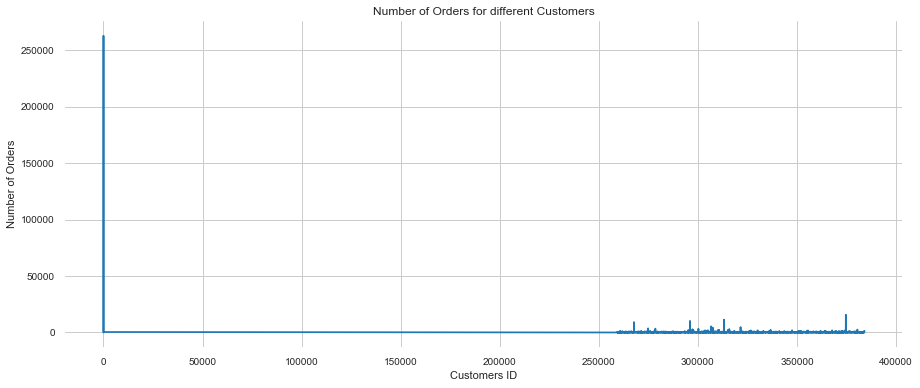

In [87]:
orders = df_new.groupby(by=['cust_id','country'], as_index=False)['invoice_num'].count()

plt.subplots(figsize=(15,6))
plt.plot(orders.cust_id, orders.invoice_num)
plt.xlabel('Customers ID')
plt.ylabel('Number of Orders')
plt.title('Number of Orders for different Customers')
plt.show()

### Check TOP 5 most number of orders 

In [88]:
print('The TOP 5 customers with most number of orders...')
orders.sort_values(by='invoice_num', ascending=False).head()

The TOP 5 customers with most number of orders...


,cust_id,country,invoice_num
7,-1,United Kingdom,262698
4028,374661,United Kingdom,15694
1897,313131,EIRE,11354
1307,296016,United Kingdom,10222
343,267708,United Kingdom,9192


## How much money spent by the customers?

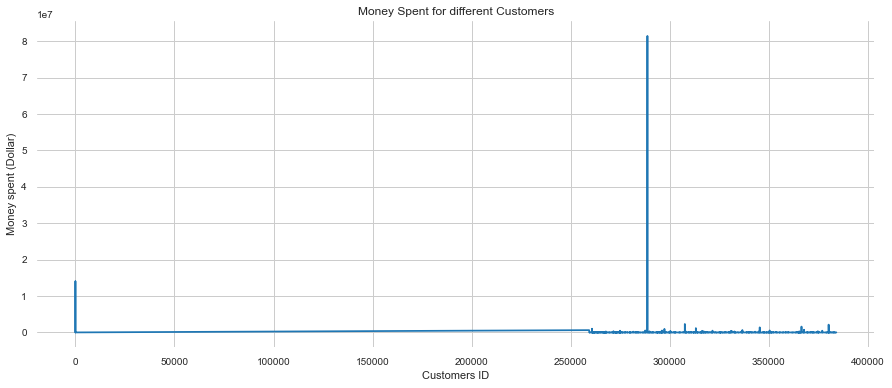

In [89]:
money_spent = df_new.groupby(by=['cust_id','country'], as_index=False)['amount_spent'].sum()

plt.subplots(figsize=(15,6))
plt.plot(money_spent.cust_id, money_spent.amount_spent)
plt.xlabel('Customers ID')
plt.ylabel('Money spent (Dollar)')
plt.title('Money Spent for different Customers')
plt.show()

### Check TOP 5 highest money spent 

In [90]:
print('The TOP 5 customers with highest money spent...')
money_spent.sort_values(by='amount_spent', ascending=False).head()

The TOP 5 customers with highest money spent...


,cust_id,country,amount_spent
1055,288687,United Kingdom,8.142170e+07
7,-1,United Kingdom,1.404425e+07
1707,307566,Netherlands,2.326431e+06
4219,380142,United Kingdom,2.152388e+06
3746,366450,United Kingdom,1.613146e+06


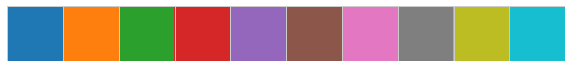

In [91]:
# color available
sns.palplot(color)

In [92]:
df_new.head()

,invoice_date,stock_code,year_month,month,day,hour,description,quantity,unit_price,amount_spent,cust_id,country,invoice_num
0,2019-02-02 12:50:00,465549,201902,2,6,12,family album white picture frame,6,11.73,70.38,278166,United Kingdom,6355745
1,2018-12-26 09:06:00,482370,201812,12,3,9,london bus coffee mug,3,3.52,10.56,337701,United Kingdom,6283376
2,2019-02-15 09:45:00,490728,201902,2,5,9,set 12 colour pencils dolly girl,72,0.90,64.80,267099,France,6385599
3,2018-06-22 07:14:00,459186,201806,6,5,7,union jack flag luggage tag,3,1.73,5.19,380478,United Kingdom,6044973
4,2018-09-10 11:58:00,1733592,201809,9,1,11,washroom metal sign,3,3.40,10.20,-1,United Kingdom,6143225


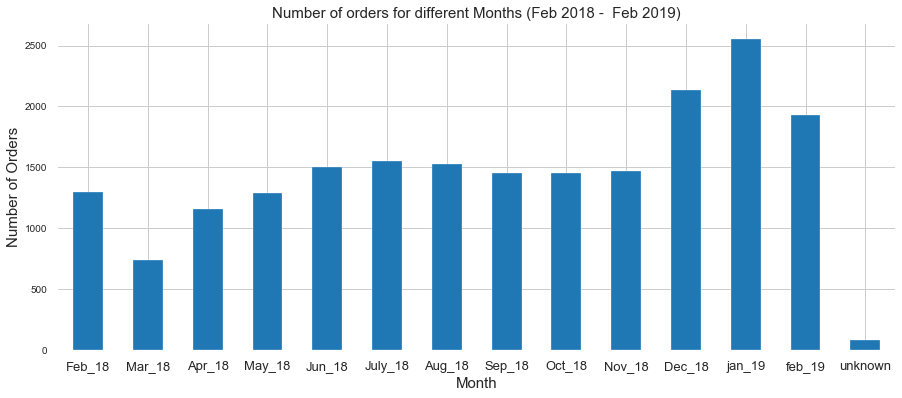

In [108]:
ax = df_new.groupby('invoice_num')['year_month'].unique().value_counts().sort_index().plot(kind='bar',color=color[0],figsize=(15,6))
ax.set_xlabel('Month',fontsize=15)
ax.set_ylabel('Number of Orders',fontsize=15)
ax.set_title('Number of orders for different Months (Feb 2018 -  Feb 2019)',fontsize=15)
ax.set_xticklabels(('Feb_18','Mar_18','Apr_18','May_18','Jun_18','July_18','Aug_18','Sep_18','Oct_18','Nov_18','Dec_18','jan_19','feb_19','unknown'), rotation='horizontal', fontsize=13)
plt.show()

## How many orders (per day)?

In [94]:
df_new.groupby('invoice_num')['day'].unique().value_counts().sort_index()

[1]    3728
[2]    4276
[3]    3178
[5]    2292
[6]    3153
[7]    3509
Name: day, dtype: int64

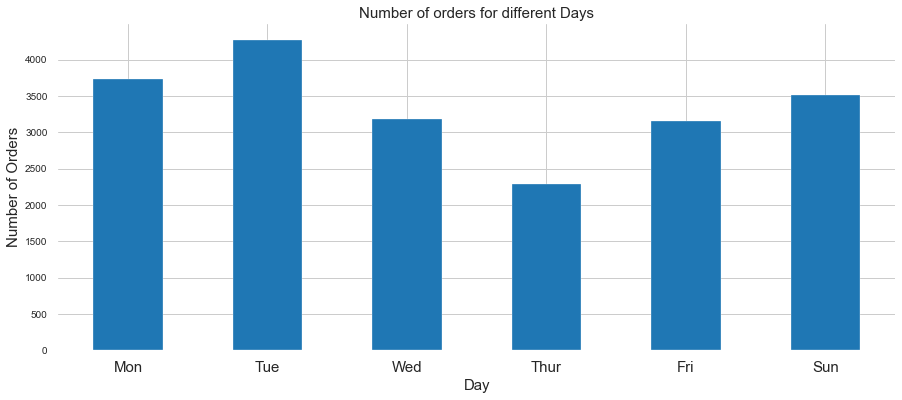

In [95]:
ax = df_new.groupby('invoice_num')['day'].unique().value_counts().sort_index().plot(kind='bar',color=color[0],figsize=(15,6))
ax.set_xlabel('Day',fontsize=15)
ax.set_ylabel('Number of Orders',fontsize=15)
ax.set_title('Number of orders for different Days',fontsize=15)
ax.set_xticklabels(('Mon','Tue','Wed','Thur','Fri','Sun'), rotation='horizontal', fontsize=15)
plt.show()

## How many orders (per hour)?

In [96]:
df_new.groupby('invoice_num')['hour'].unique().value_counts().iloc[:-1].sort_index()

[2]        1
[3]       29
[4]      567
[5]     1501
[6]     2377
[7]     2424
[8]     3241
[9]     2774
[10]    2473
[11]    2362
[12]    1349
[13]     675
[14]     198
[15]     146
[16]      18
Name: hour, dtype: int64

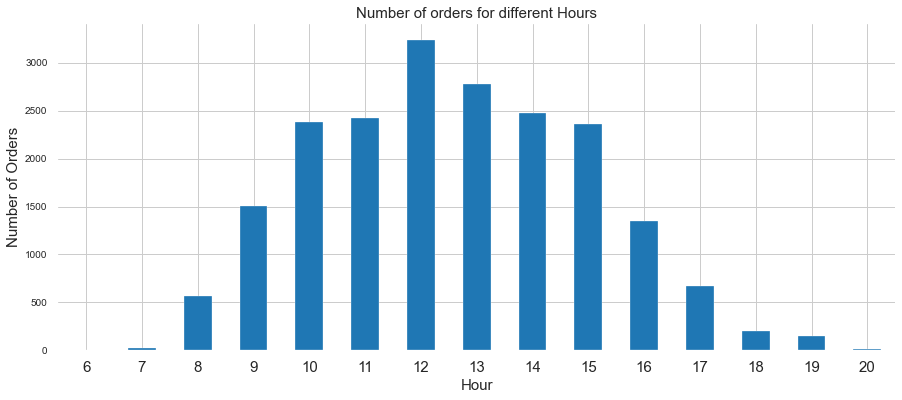

In [97]:
ax = df_new.groupby('invoice_num')['hour'].unique().value_counts().iloc[:-1].sort_index().plot(kind='bar',color=color[0],figsize=(15,6))
ax.set_xlabel('Hour',fontsize=15)
ax.set_ylabel('Number of Orders',fontsize=15)
ax.set_title('Number of orders for different Hours',fontsize=15)
ax.set_xticklabels(range(6,21), rotation='horizontal', fontsize=15)
plt.show()

# Discover patterns for **<span class="girk">Unit Price</span>**

In [98]:
df_new.unit_price.describe()

count    1.061386e+06
mean     8.530635e+00
std      2.329213e+03
min     -1.526564e+04
25%      1.730000e+00
50%      2.880000e+00
75%      5.700000e+00
max      1.696285e+06
Name: unit_price, dtype: float64

**We see that there are unit price = 0 (FREE items)**

<span class="mark">There are some free items given to customers from time to time</span>.

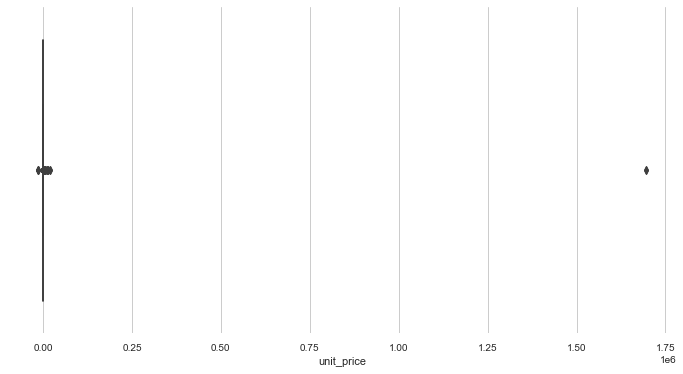

In [99]:
# check the distribution of unit price
plt.subplots(figsize=(12,6))
sns.boxplot(df_new.unit_price)
plt.show()

In [101]:
df_free = df_new[df_new.unit_price == 0]

In [102]:
df_free.head()

,invoice_date,stock_code,year_month,month,day,hour,description,quantity,unit_price,amount_spent,cust_id,country,invoice_num
151,2028-02-18 11:31:00,445872,202802,2,5,11,strawberry ceramic trinket box,3,0.0,0.0,-1,United Kingdom,5914040
1427,2018-05-12 10:19:00,433692,201805,5,6,10,blue polkadot luggage tag,9,0.0,0.0,-1,United Kingdom,5996936
1546,2018-05-12 10:19:00,1787079,201805,5,6,10,jumbo bag strawberry,3,0.0,0.0,-1,United Kingdom,5996936
1734,2019-01-16 07:35:00,1786134,201901,1,3,7,found,81,0.0,0.0,-1,United Kingdom,6318818
4634,2019-01-14 07:18:00,474726,201901,1,1,7,check,3,0.0,0.0,-1,United Kingdom,6313890


In [103]:
df_free.year_month.value_counts().sort_index()

201802     20
201803    168
201804      2
201805    176
201806     18
201807    184
201808     12
201809    100
201810     14
201811    100
201812     38
201901    152
201902     72
202802    118
Name: year_month, dtype: int64

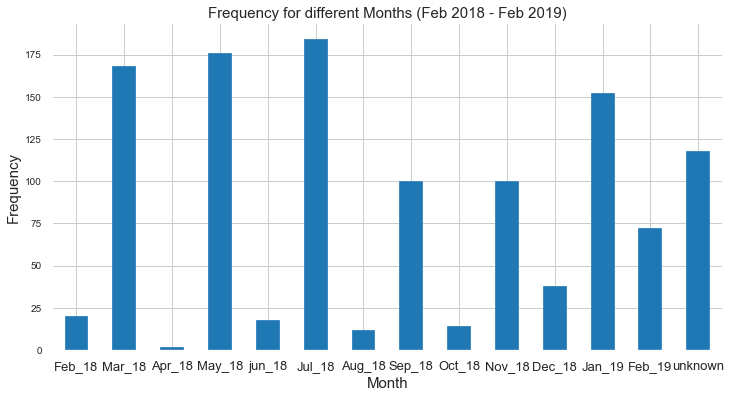

In [104]:
ax = df_free.year_month.value_counts().sort_index().plot(kind='bar',figsize=(12,6), color=color[0])
ax.set_xlabel('Month',fontsize=15)
ax.set_ylabel('Frequency',fontsize=15)
ax.set_title('Frequency for different Months (Feb 2018 - Feb 2019)',fontsize=15)
ax.set_xticklabels(('Feb_18','Mar_18','Apr_18','May_18','jun_18','Jul_18','Aug_18','Sep_18','Oct_18','Nov_18','Dec_18','Jan_19','Feb_19','unknown'), rotation='horizontal', fontsize=13)
plt.show()

**Not clear why there are FREE items given to certain customers**
- On average, the company <span class="mark">gave out 2-4 times FREE items</span> to customers <span class="mark">each month (Except in July 2018)</span>

# Discover patterns for each **<span class="girk">Country</span>**

In [105]:
df_new.head()

,invoice_date,stock_code,year_month,month,day,hour,description,quantity,unit_price,amount_spent,cust_id,country,invoice_num
0,2019-02-02 12:50:00,465549,201902,2,6,12,family album white picture frame,6,11.73,70.38,278166,United Kingdom,6355745
1,2018-12-26 09:06:00,482370,201812,12,3,9,london bus coffee mug,3,3.52,10.56,337701,United Kingdom,6283376
2,2019-02-15 09:45:00,490728,201902,2,5,9,set 12 colour pencils dolly girl,72,0.90,64.80,267099,France,6385599
3,2018-06-22 07:14:00,459186,201806,6,5,7,union jack flag luggage tag,3,1.73,5.19,380478,United Kingdom,6044973
4,2018-09-10 11:58:00,1733592,201809,9,1,11,washroom metal sign,3,3.40,10.20,-1,United Kingdom,6143225


## How many orders for each country?

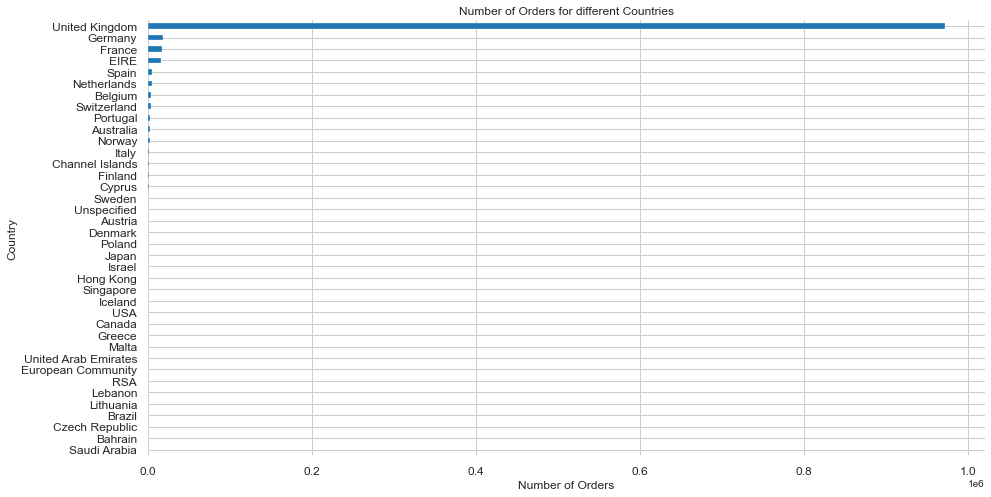

In [106]:
group_country_orders = df_new.groupby('country')['invoice_num'].count().sort_values()
# del group_country_orders['United Kingdom']

# plot number of unique customers in each country (with UK)
plt.subplots(figsize=(15,8))
group_country_orders.plot(kind='barh', fontsize=12, color=color[0])
plt.xlabel('Number of Orders', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.title('Number of Orders for different Countries', fontsize=12)
plt.show()

## How much money spent by each country?

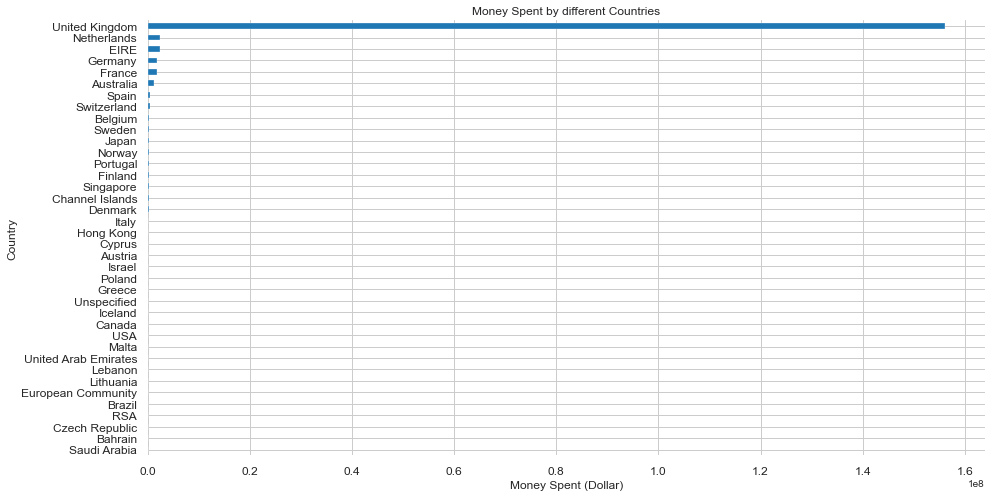

In [107]:
group_country_amount_spent = df_new.groupby('country')['amount_spent'].sum().sort_values()


plt.subplots(figsize=(15,8))
group_country_amount_spent.plot(kind='barh', fontsize=12, color=color[0])
plt.xlabel('Money Spent (Dollar)', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.title('Money Spent by different Countries', fontsize=12)
plt.show()

In [3]:



import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
dff= pd.read_csv(r'H:\E-Commerce-Data-EDA-master\transaction_data.csv')

from subprocess import check_output


from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
word_string=" "
for i in dff['ItemDescription']:
    word_string+=str(i)
wordcloud = WordCloud(stopwords=STOPWORDS,
                          background_color='white', 
                      max_words=300
                         ).generate(word_string)

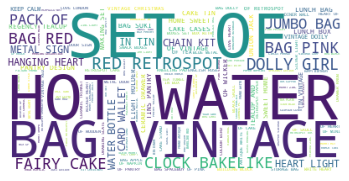

In [4]:
plt.clf()
plt.imshow(wordcloud)
plt.axis('off')
plt.show()